# Demo Run

In [1]:
# %load_ext autoreload
# %autoreload 2
# # # this may cause DisentenglementTargetManager to reimported, losing all the data e.g. configurations.

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

In [3]:
import os
import sys
import gc
import warnings
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import rapids_singlecell as rsc
import scanpy as sc
import cupyx as cpx
import pandas as pd
import numpy as np
import scipy.stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scib
import scib_metrics

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

sc.settings.verbosity = 3

print(f"CUDA used: {torch.cuda.is_available()}")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning.fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/__init__.py:36: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_na

CUDA used: True


In [8]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 14811 × 4999
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split'
    var: 'id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dose_colors', 'drug_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'product_dose_colors', 'rank_genes_groups_cov', 'umap', 'vehicle_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [46]:
adata.X = adata.layers["counts"].copy()
del adata.layers
gc.collect()

2273

In [44]:
adata.obs["dose_val_log"] = np.log10(adata.obs["dose_val"] + 1e-8)
adata.obs

,sample,size_factor,n.umi,hash_umis,pval,qval,top_to_second_best_ratio,top_oligo,drug,dose,...,product_dose,louvain,dose_val,cell_type,drug_dose_name,cov_drug_dose_name,condition,control,split,dose_val_log
index,,,,,,,,,,,,,,,,,,,,,
A01_A01_RT_390,sciChem18,0.849329,3430.0,16.0,1.404159e-140,3.650813e-139,15.005464,Nutlin_0.5_AB02,Nutlin,0.5,...,Nutlin 0.5,1,0.005,A549,Nutlin_0.005,A549_Nutlin_0.005,Nutlin,0,test,-2.301029e+00
A01_A01_RT_396,sciChem18,1.612486,6512.0,35.0,0.000000e+00,0.000000e+00,2.379168,Dex_50_BC10,Dex,50.0,...,Dex 50.0,7,0.500,A549,Dex_0.5,A549_Dex_0.5,Dex,0,ood,-3.010300e-01
A01_A01_RT_400,sciChem18,0.786681,3177.0,23.0,3.035262e-222,9.409311e-221,20.920000,Nutlin_0_AB04,Vehicle,0.0,...,Vehicle 0.0,3,1.000,A549,Vehicle_1.0,A549_Vehicle_1.0,Vehicle,1,train,4.342945e-09
A01_A01_RT_401,sciChem18,1.258641,5083.0,69.0,0.000000e+00,0.000000e+00,1.892483,BMS_0.1_BH11,BMS,0.1,...,BMS 0.1,1,0.001,A549,BMS_0.001,A549_BMS_0.001,BMS,0,train,-2.999996e+00
A01_A01_RT_402,sciChem18,3.432476,13862.0,104.0,0.000000e+00,0.000000e+00,1.262781,Nutlin_10_AA03,Nutlin,10.0,...,Nutlin 10.0,3,0.100,A549,Nutlin_0.1,A549_Nutlin_0.1,Nutlin,0,test,-1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H12_B02_RT_745,sciChem18,0.731463,2954.0,63.0,0.000000e+00,0.000000e+00,63.363772,Nutlin_1_AB01,Nutlin,1.0,...,Nutlin 1.0,3,0.010,A549,Nutlin_0.01,A549_Nutlin_0.01,Nutlin,0,train,-2.000000e+00
H12_B02_RT_750,sciChem18,0.611616,2470.0,116.0,0.000000e+00,0.000000e+00,143.054022,Nutlin_50_AA10,Nutlin,50.0,...,Nutlin 50.0,5,0.500,A549,Nutlin_0.5,A549_Nutlin_0.5,Nutlin,0,ood,-3.010300e-01
H12_B02_RT_752,sciChem18,3.208135,12956.0,63.0,0.000000e+00,0.000000e+00,4.731265,BMS_0.1_BG07,BMS,0.1,...,BMS 0.1,3,0.001,A549,BMS_0.001,A549_BMS_0.001,BMS,0,train,-2.999996e+00


In [48]:
adata.obs["sample"].unique()

['sciChem18']
Categories (1, object): ['sciChem18']

## Train

In [56]:
warmup_epoch_range = [10, 40]
# _, n_epochs_kl_warmup = warmup_epoch_range
n_epochs_kl_warmup = 400

counteractive_minibatch_settings = dict(
    method="categorical_random",
    method_kwargs=dict(
        within_labels=False,
        within_batch=False,
        within_categorical_covs=None,
        seed="forward",
    ),
)

disentanglement_targets_configurations = [
    dict(
        obs_key="dose_val_log",
        n_reserved_latent=8,
        counteractive_minibatch_settings=counteractive_minibatch_settings,
        losses=[
            dict(
                target_type="pseudo_categorical",
                coefficient="squared",
                progress_bar=True,
                weight=100,
                method="mse",
                latent_group="reserved",
                is_minimized=False,
                transformation="inverse",
                warmup_period=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                target_type="categorical",
                progress_bar=False,
                weight=10,
                method="mse",
                latent_group="reserved",
                is_minimized=True,
                transformation="none",
                warmup_period=warmup_epoch_range,
                method_kwargs={},
            ),
        ],
    ),
    dict(
        obs_key="condition",
        n_reserved_latent=8,
        counteractive_minibatch_settings=counteractive_minibatch_settings,
        losses=[
            dict(
                target_type="categorical",
                progress_bar=True,
                weight=100,
                method="mse",
                latent_group="reserved",
                is_minimized=False,
                transformation="inverse",
                warmup_period=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                target_type="categorical",
                progress_bar=False,
                weight=10,
                method="mse",
                latent_group="reserved",
                is_minimized=True,  # counteractive_example = "positive",
                transformation="none",
                warmup_period=warmup_epoch_range,
                method_kwargs={},
            ),
        ],
    ),
]

model_params = dict(
    n_hidden=512,
    n_layers=3,
    n_latent=36,
    gene_likelihood="nb",
    use_batch_norm="none",
    use_layer_norm="both",
    dropout_rate=0.1,
    include_auxillary_loss=True,
)

train_params = dict(
    max_epochs=2000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs=dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    ),
)

dataset_params = dict(
    layer=None,
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentanglement_targets_configurations=disentanglement_targets_configurations,
)

tardis.MyModel.setup_anndata(adata, **dataset_params)

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(adata, **model_params)
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    vae.train(**train_params)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-d1c642e5-ee3f-553d-8597-ddbd574144e8,MIG-9549f4ed-4344-565a-8026-e9f838b3ca22]
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1/2000:   0%|                                                                                                                                                           | 0/2000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:63: UserWarning: Possible group definition indices are calculating for `dose_val_log` for `training` set.
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:63: UserWarning: Number of elements in each group for `dose_val_log` in `training` set: 1572,1430,1748,1434,1547,1410,2708
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:63: UserWarning: Possible group definition indices are calculating for `condition` for `training` set.
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:63: UserWarning: Number of elements in each group for `condition` in `training` set: 1568,3542,2207,2796,1736
  possible_indices = CachedPossib

Epoch 255/2000:  13%|███                     | 254/2000 [08:09<52:54,  1.82s/it, v_num=1, total_loss_train=1.97e+3, kl_local_train=53.3, tardis_dose_val_log_0_train=21, tardis_condition_0_train=14.5]

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/pytorch/trainer/call.py:53: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [ ]:
# dir_path = os.path.join(
#     tardis.config.io_directories["models"],
#     "run7"
# )

# vae.save(
#     dir_path,
#     overwrite=False,
# )

## Load Model

In [ ]:
# dir_path = os.path.join(
#     tardis.config.io_directories["models"],
#     "run7"
# )
# vae = tardis.MyModel.load(dir_path, adata=adata)

## Check training

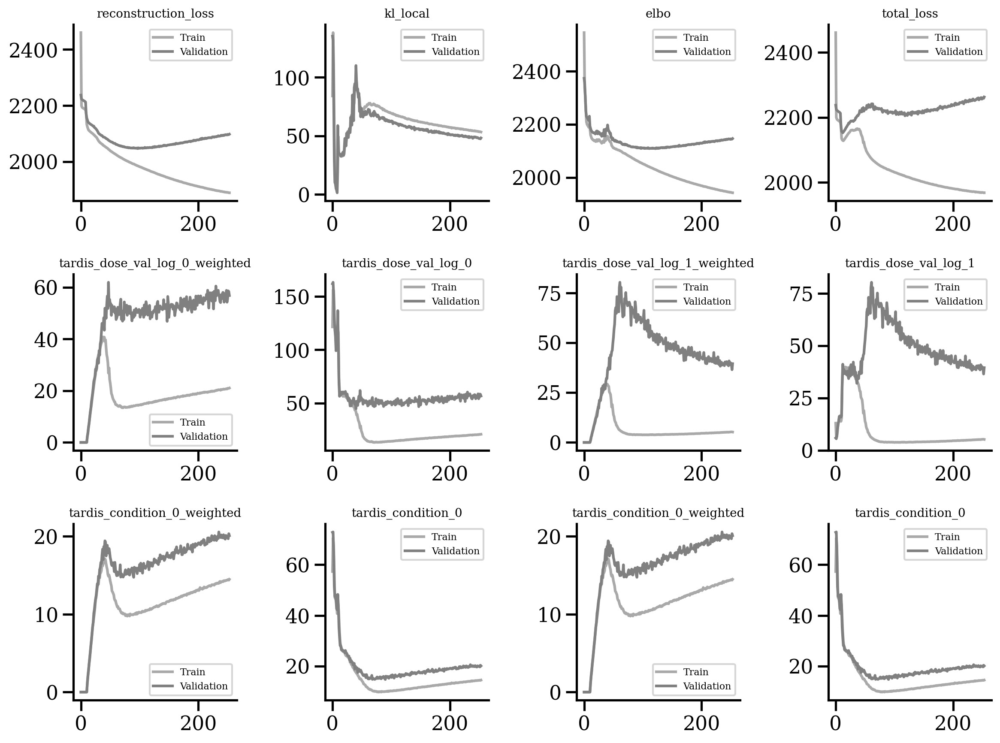

In [57]:
vae.plot_training_history(
    ignore_first=0, 
    n_col=4,
    metrics_name=[
        "reconstruction_loss", "kl_local", "elbo", "total_loss",
        #
        "tardis_dose_val_log_0_weighted", 
        "tardis_dose_val_log_0",
        "tardis_dose_val_log_1_weighted", 
        "tardis_dose_val_log_1",
        #
        "tardis_condition_0_weighted", 
        "tardis_condition_0",
        "tardis_condition_0_weighted", 
        "tardis_condition_0",
    ]
)

In [ ]:
# from tardis._disentenglementtargetmanager import DisentenglementTargetManager
# display(np.array(DisentenglementTargetManager.configurations.get_by_obs_key("age").reserved_latent_indices))
# display(np.array(DisentenglementTargetManager.configurations.get_by_obs_key("sex").reserved_latent_indices))

In [ ]:
# vae.plot_latent_kde(
#     adata_obs=adata.obs,
#     target_obs_key="sex",
#     latent_representation=vae.get_latent_representation(),
#     latent_dim_of_interest=None
# )

# Metrics

In [59]:
batch_size_vae_metrics = 512
vae_metrics = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size_vae_metrics)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size_vae_metrics).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    # "r2_train_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    # "r2_train_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
    # "r2_validation_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
    # "r2_validation_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
}
for k, v in vae_metrics.items():
    print(k, v)

reconstruction_error -1920.910636520154
elbo -1973.424560546875
r2_train 0.9990486403767528
r2_validation 0.9990381954369042


# Visualization

In [66]:
def prepare(ad_latent):
    sc.pp.neighbors(ad_latent, n_neighbors = 30)
    sc.tl.umap(ad_latent)
    sc.tl.diffmap(adata=ad_latent)
    root_age = ad_latent.obs["dose_val_log"].min()
    ad_latent.uns['iroot'] = np.flatnonzero(ad_latent.obs['dose_val_log'] == root_age)[0]
    sc.tl.dpt(ad_latent)

In [67]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
prepare(latent)
latent

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9973904  0.99677837 0.996003   0.99499583 0.993995
     0.992285   0.99109805 0.9892095  0.98754525 0.98695934 0.9862445
     0.9855943  0.98261315 0.97941756]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


AnnData object with n_obs × n_vars = 14811 × 36
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split', 'dose_val_log', '_scvi_batch', '_scvi_labels', 'dpt_pseudotime'
    uns: 'neighbors', 'umap', 'diffmap_evals', 'iroot'
    obsm: 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

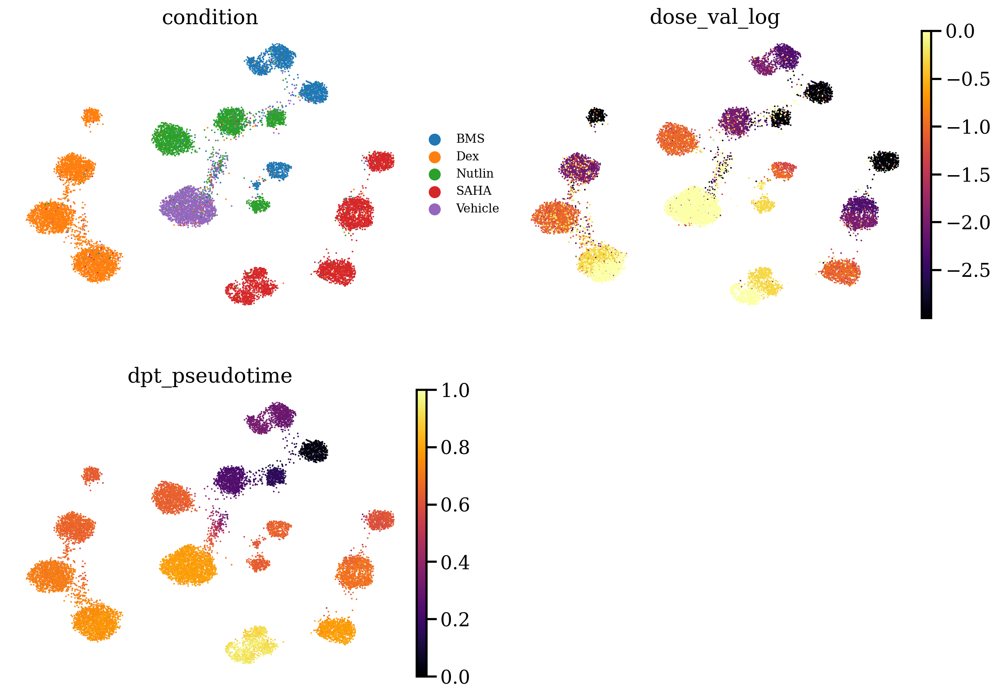

In [71]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        color_map="inferno",
        legend_fontsize="xx-small"
    )

In [72]:
del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99739414 0.9926218  0.98854977 0.9037527  0.89086044
     0.8867076  0.87994486 0.8751223  0.8727948  0.8707141  0.87069607
     0.86879617 0.86651605 0.86608   ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 28)

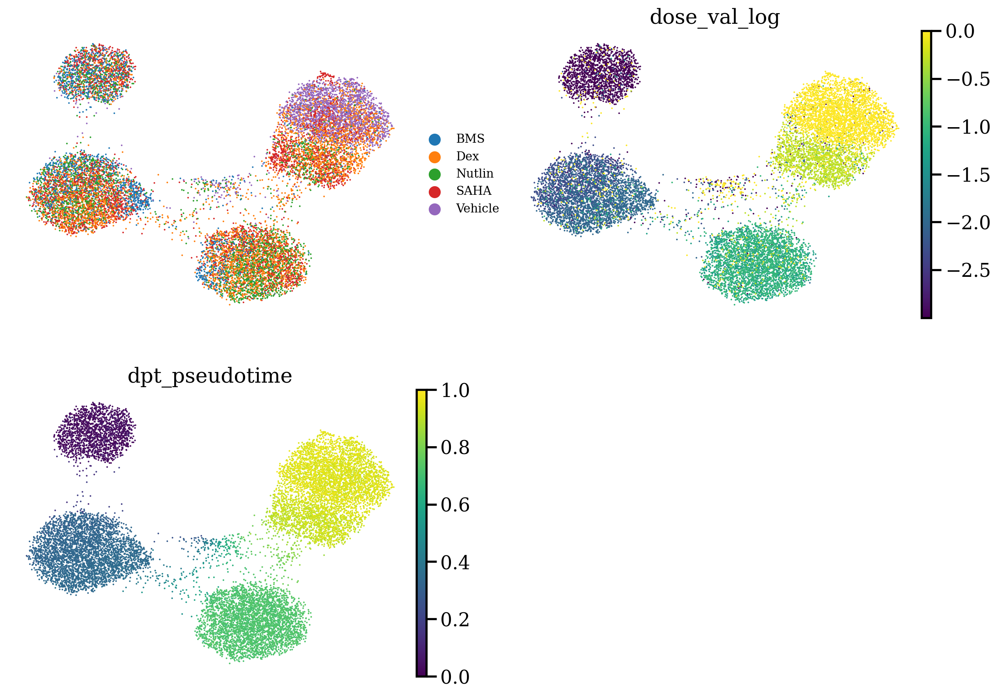

In [77]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("condition").unreserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9973156  0.9966806  0.9926709  0.9901787  0.9013361
     0.8960351  0.89570576 0.8879672  0.886171   0.8834677  0.87812847
     0.8754407  0.87192506 0.87017626]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 28)

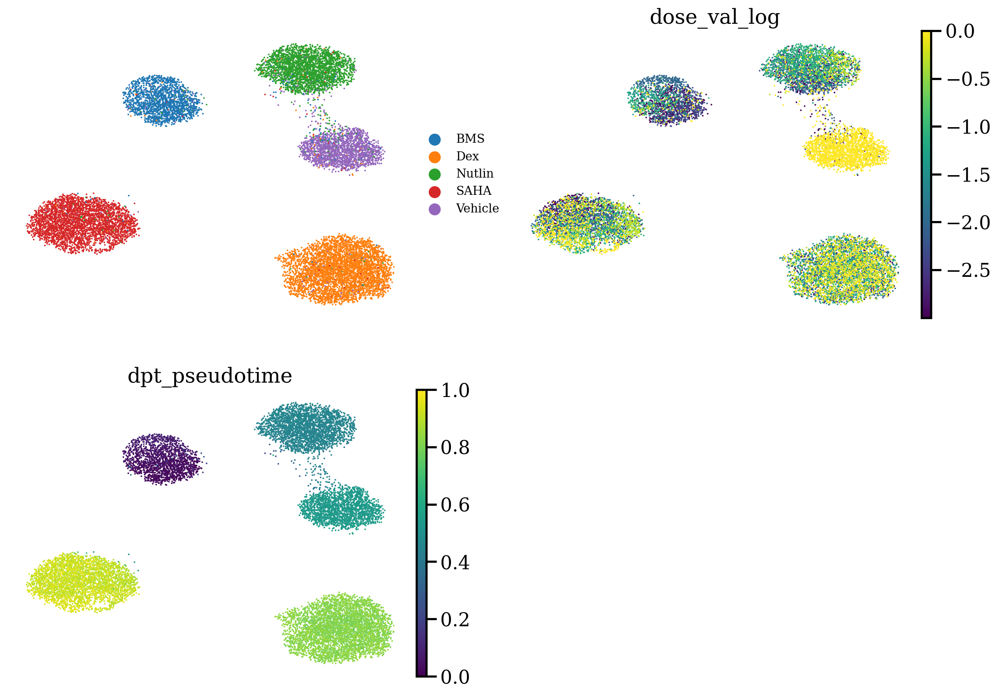

In [79]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("dose_val_log").unreserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9225237  0.9156716  0.912866   0.9109906  0.9097608
     0.90642726 0.9025196  0.89829123 0.852062   0.8462263  0.840347
     0.8390336  0.83550835 0.83343947]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 20)

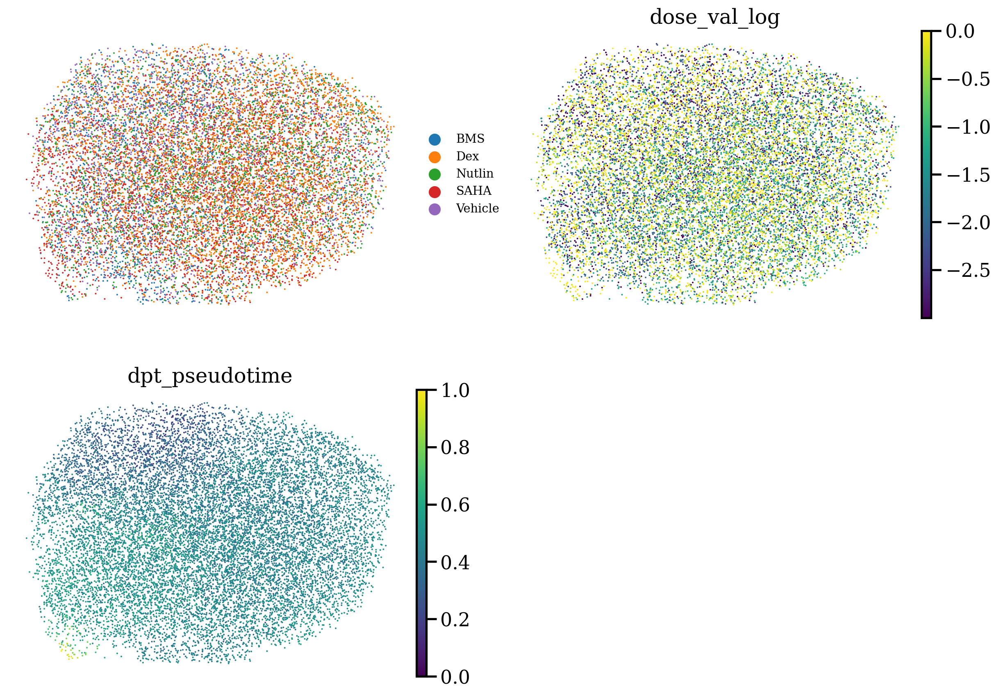

In [80]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.unreserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99984646 0.99970806 0.99953824 0.9984755  0.99762243
     0.9950345  0.99431825 0.9929834  0.99274623 0.99114245 0.9908721
     0.99044615 0.9892217  0.9887077 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:01)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 8)

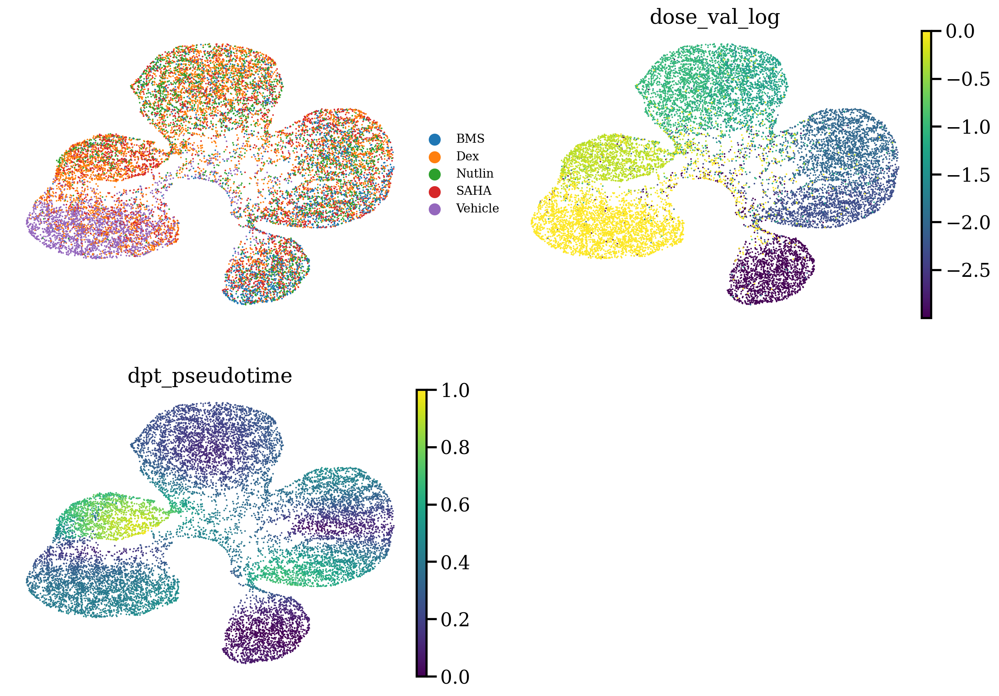

In [81]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("dose_val_log").reserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9991344  0.9989919  0.9981652  0.99799716 0.9713709
     0.96507186 0.9634794  0.9625084  0.9581824  0.95679307 0.954676
     0.9533908  0.9493599  0.94771373]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 8)

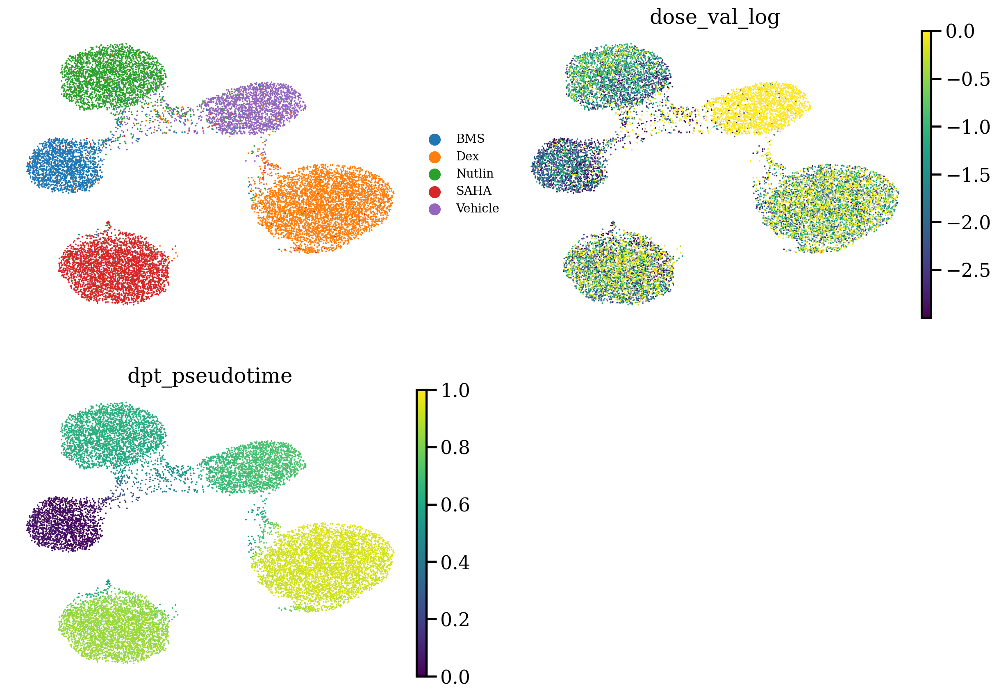

In [82]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

# condition types

In [83]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
for cell_type in latent.obs["condition"].unique():
    _latent = latent[latent.obs["condition"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["age", "sex", "concatenated_integration_covariates"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


KeyError: 'Could not find key age in .var_names or .obs.columns.'

<Figure size 2183.4x480 with 0 Axes>

In [ ]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
for cell_type in latent.obs["cell_type"].unique():
    _latent = latent[latent.obs["cell_type"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["age", "sex", "concatenated_integration_covariates"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();
    
del latent
gc.collect();

In [ ]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("sex").reserved_latent_indices], obs=adata.obs.copy())
for cell_type in latent.obs["cell_type"].unique():
    _latent = latent[latent.obs["cell_type"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["age", "sex", "concatenated_integration_covariates"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();
    
del latent
gc.collect();

In [ ]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.unreserved_latent_indices], obs=adata.obs.copy())
for cell_type in latent.obs["cell_type"].unique():
    _latent = latent[latent.obs["cell_type"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["age", "sex", "concatenated_integration_covariates"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();
    
del latent
gc.collect();